# Data Set

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
raw_dataset = pd.read_csv('./penguins_size.csv',
                           names=['Species', 'Island', 'Culmen Length', 'Culmen Depth',
                                  'Flipper Length', 'Body Mass', 'Sex'],
                           na_values='NA')
dataset = raw_dataset.copy()

dataset.isna().sum()

Species            0
Island             0
Culmen Length      2
Culmen Depth       2
Flipper Length     2
Body Mass          2
Sex               10
dtype: int64

In [2]:
dataset = dataset.dropna()
dataset = dataset.drop(dataset[dataset['Sex']=='.'].index, axis=0)

dataset

,Species,Island,Culmen Length,Culmen Depth,Flipper Length,Body Mass,Sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,MALE
...,...,...,...,...,...,...,...
338,Gentoo,Biscoe,47.2,13.7,214.0,4925.0,FEMALE
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


# Scatter Plot Matrix

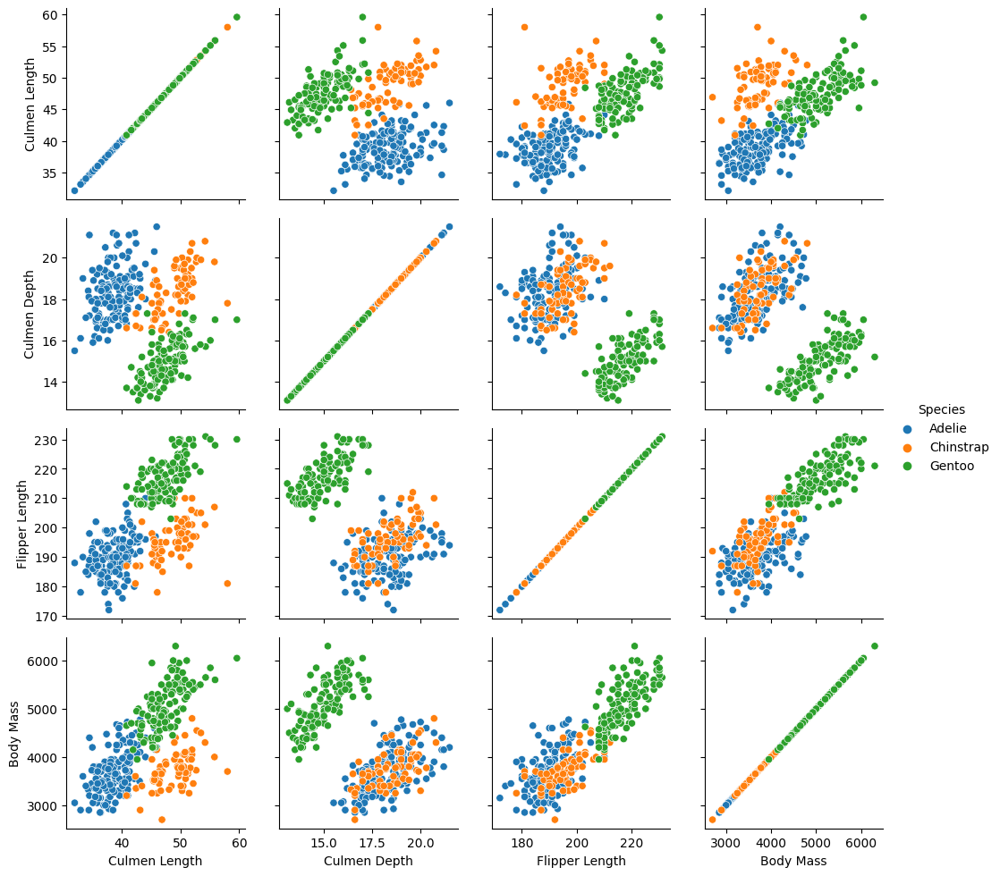

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.PairGrid(dataset, hue='Species')
g.map(sns.scatterplot)
g.add_legend()

plt.show()

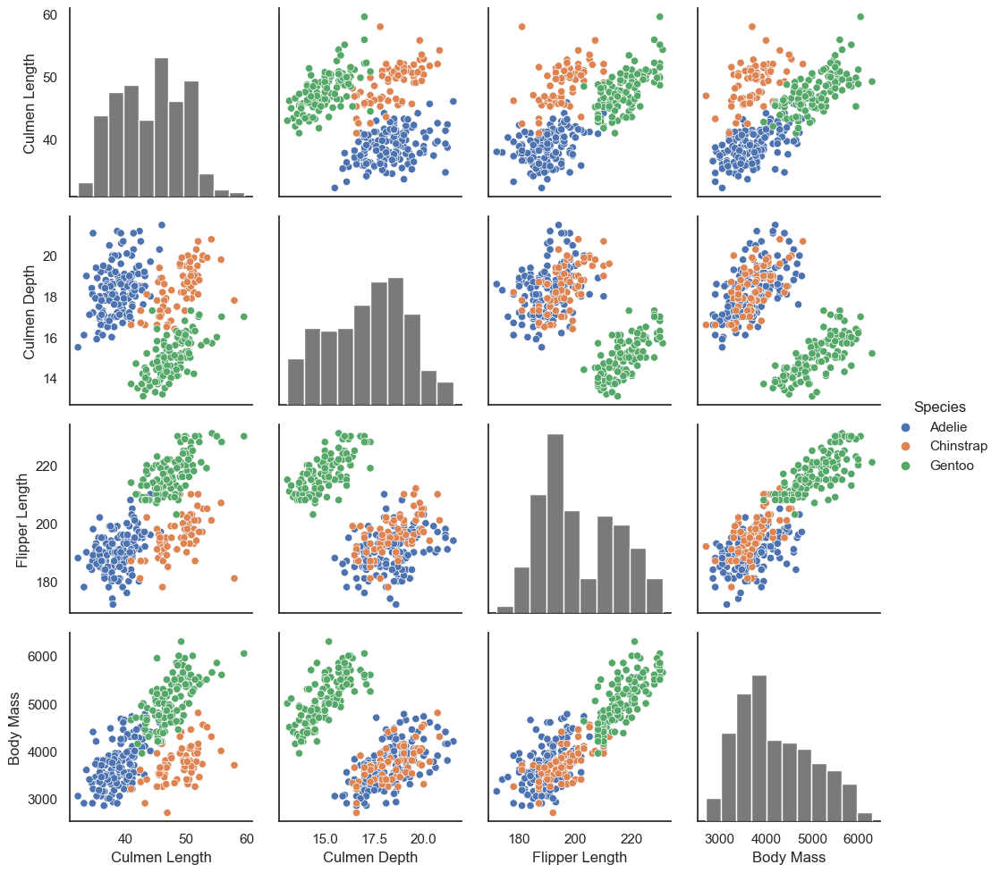

In [4]:
sns.set(style='white', color_codes=True)

g = sns.PairGrid(dataset, hue='Species')
g.map_diag(sns.histplot, hue=None, color='.3')
g.map_offdiag(sns.scatterplot)
g.add_legend()

plt.show()

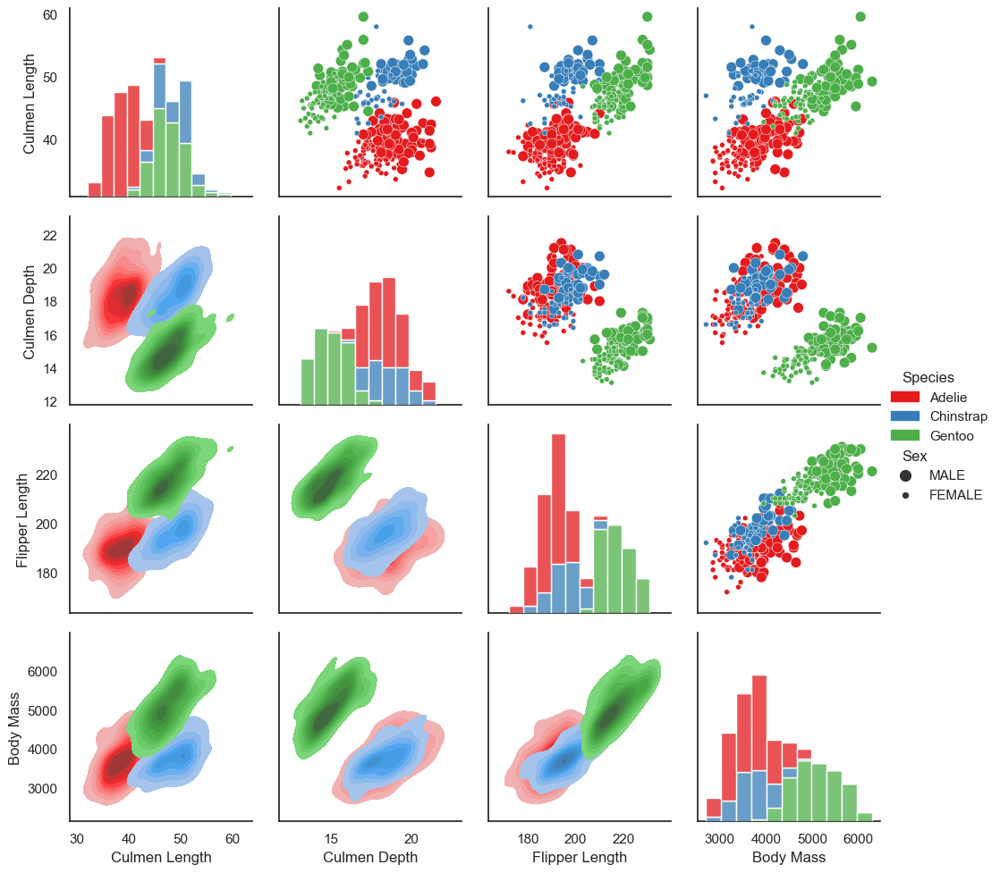

In [5]:
g = sns.PairGrid(dataset, hue='Species', palette='Set1')
g.map_diag(sns.histplot, multiple='stack')
g.map_upper(sns.scatterplot, size=dataset['Sex'])
g.map_lower(sns.kdeplot, fill=True)
g.add_legend(title='', adjust_subtitles=True)

plt.show()

# Andrews Curves

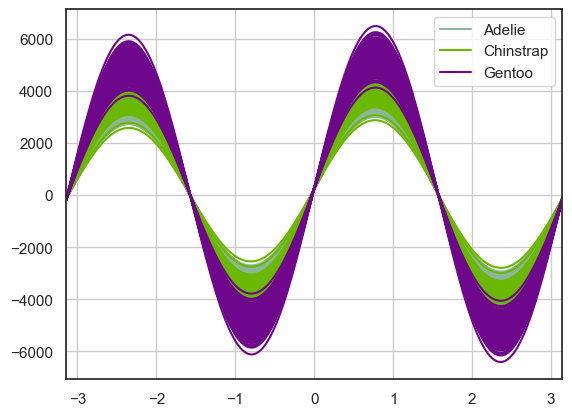

In [6]:
from pandas.plotting import andrews_curves
andrews_curves(dataset.drop(['Island', 'Sex'], axis=1), 'Species')

plt.show()

In [7]:
import numpy as np
max_min_scaler = lambda x: (x - np.min(x)) / (np.max(x) - np.min(x))

dataset_std = dataset.copy()
dataset_std['Culmen Length'] = dataset_std[['Culmen Length']].apply(max_min_scaler)
dataset_std['Culmen Depth'] = dataset_std[['Culmen Depth']].apply(max_min_scaler)
dataset_std['Flipper Length'] = dataset_std[['Flipper Length']].apply(max_min_scaler)
dataset_std['Body Mass'] = dataset_std[['Body Mass']].apply(max_min_scaler)

dataset_std

,Species,Island,Culmen Length,Culmen Depth,Flipper Length,Body Mass,Sex
0,Adelie,Torgersen,0.254545,0.666667,0.152542,0.291667,MALE
1,Adelie,Torgersen,0.269091,0.511905,0.237288,0.305556,FEMALE
2,Adelie,Torgersen,0.298182,0.583333,0.389831,0.152778,FEMALE
4,Adelie,Torgersen,0.167273,0.738095,0.355932,0.208333,FEMALE
5,Adelie,Torgersen,0.261818,0.892857,0.305085,0.263889,MALE
...,...,...,...,...,...,...,...
338,Gentoo,Biscoe,0.549091,0.071429,0.711864,0.618056,FEMALE
340,Gentoo,Biscoe,0.534545,0.142857,0.728814,0.597222,FEMALE
341,Gentoo,Biscoe,0.665455,0.309524,0.847458,0.847222,MALE
342,Gentoo,Biscoe,0.476364,0.202381,0.677966,0.694444,FEMALE


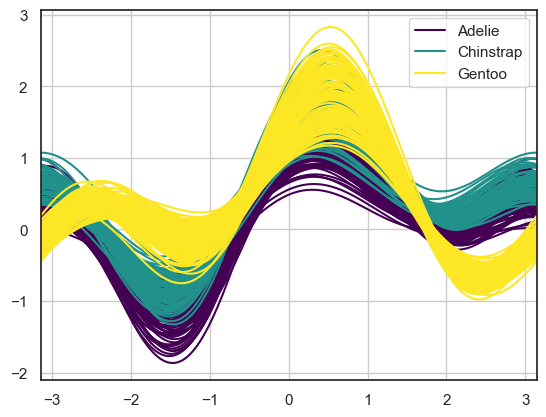

In [8]:
andrews_curves(dataset_std.drop(['Island', 'Sex'], axis=1), 'Species', colormap='viridis')

plt.show()

# Parallel Coordinates

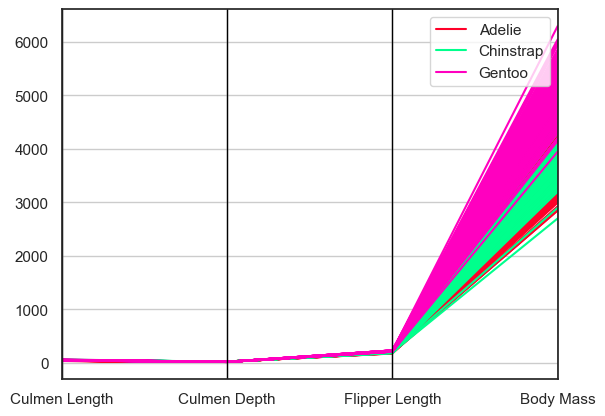

In [9]:
from pandas.plotting import parallel_coordinates
parallel_coordinates(dataset.drop(['Island', 'Sex'], axis=1), 'Species', colormap='gist_rainbow')

plt.show()

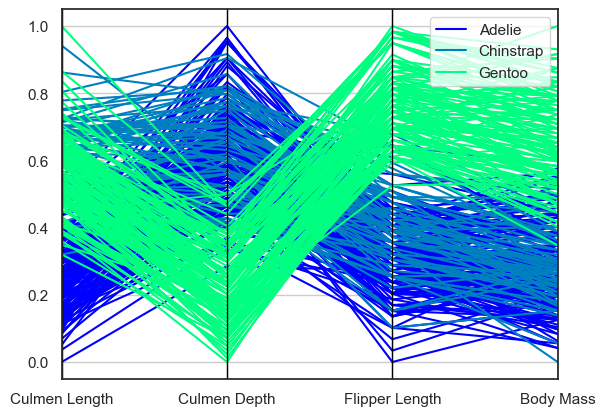

In [10]:
parallel_coordinates(dataset_std.drop(['Island', 'Sex'], axis=1), 'Species', colormap='winter')

plt.show()

# Radial Visualization

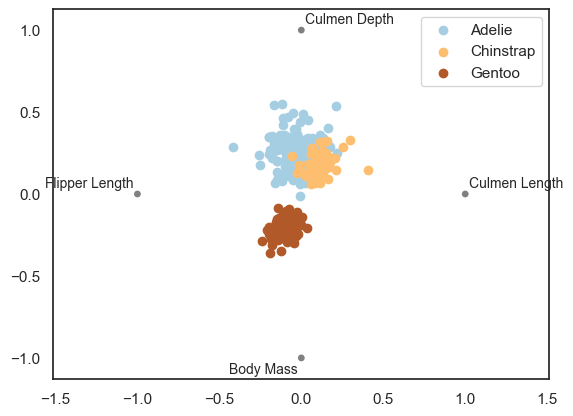

In [11]:
from pandas.plotting import radviz
radviz(dataset.drop(['Island', 'Sex'], axis=1), 'Species', colormap='Paired')

plt.show()

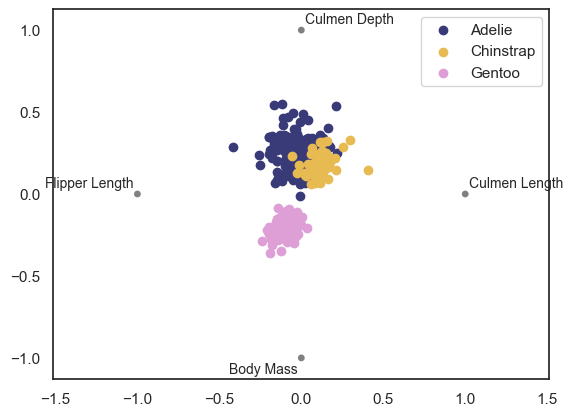

In [12]:
radviz(dataset_std.drop(['Island', 'Sex'], axis=1), 'Species', colormap='tab20b')

plt.show()

# Trellis Display

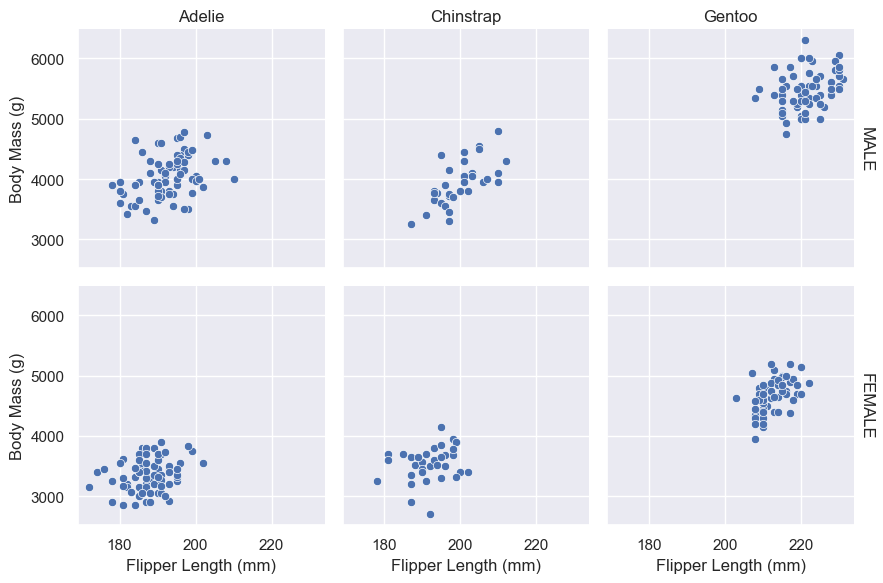

In [13]:
sns.set_style('darkgrid')

g = sns.FacetGrid(dataset, col='Species', row='Sex', margin_titles=True)
g.map_dataframe(sns.scatterplot, x='Flipper Length', y='Body Mass')
g.set_axis_labels('Flipper Length (mm)', 'Body Mass (g)')
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.tight_layout()

plt.show()

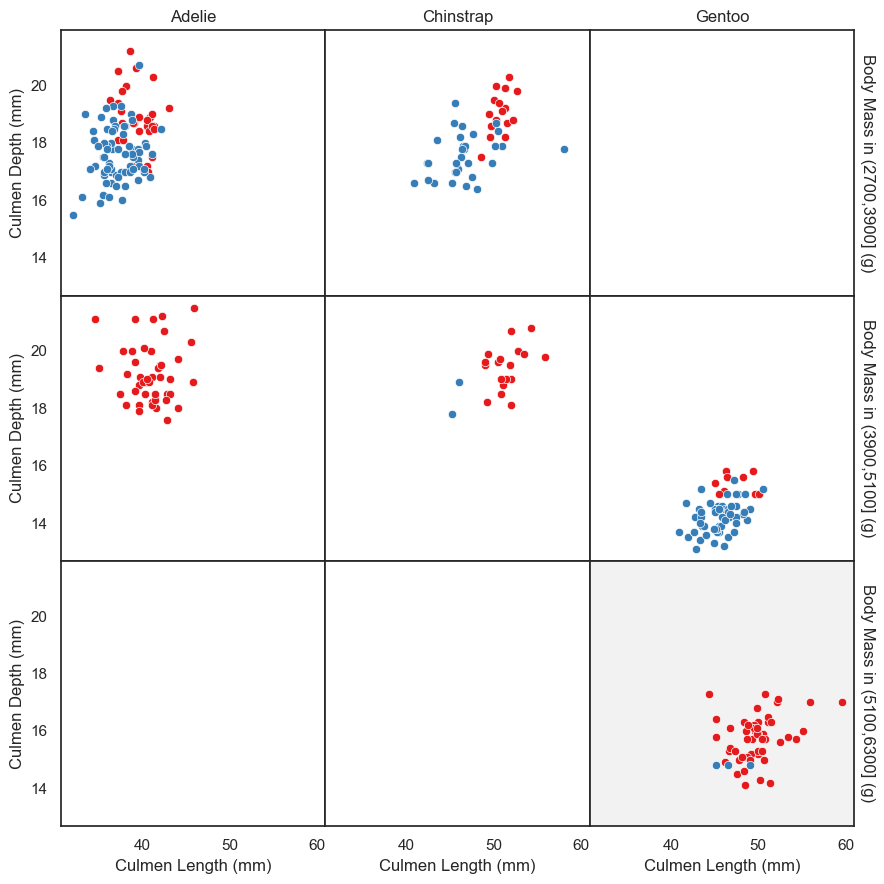

In [14]:
sns.set_style('white')

cut_dataset = dataset.copy()
mass_bins = [2700, 3900, 5100, 6300]
mass_labels = ['(2700,3900]', '(3900,5100]', '(5100,6300]']
cut_dataset['Mass Range'] = pd.cut(x=cut_dataset['Body Mass'], bins=mass_bins, labels=mass_labels)

g = sns.FacetGrid(cut_dataset, col='Species', row='Mass Range', margin_titles=True, despine=False, palette='Set1', hue='Sex')
g.map_dataframe(sns.scatterplot, x='Culmen Length', y='Culmen Depth')
g.set_axis_labels('Culmen Length (mm)', 'Culmen Depth (mm)')
g.set_titles(col_template="{col_name}", row_template='Body Mass in {row_name} (g)')
g.figure.subplots_adjust(wspace=0, hspace=0)
for (row_val, col_val), ax in g.axes_dict.items():
    if row_val == '(5100,6300]' and col_val == 'Gentoo':
        ax.set_facecolor('.95')

plt.show()

# Chernoff Faces

In [15]:
from ChernoffFace import *

dropped_dataset = dataset.reset_index(drop=True)
face_dataset = variables_rescale(dropped_dataset)
face_dataset = face_dataset.drop(['Island', 'Sex'], axis=1)
face_adelie = face_dataset.loc[face_dataset['Species']=='Adelie']
face_chinstrap = face_dataset.loc[face_dataset['Species']=='Chinstrap']
face_gentoo = face_dataset.loc[face_dataset['Species']=='Gentoo']

face_adelie.head()

,Species,Culmen Length,Culmen Depth,Flipper Length,Body Mass
0,Adelie,0.254545,0.666667,0.152542,0.291667
1,Adelie,0.269091,0.511905,0.237288,0.305556
2,Adelie,0.298182,0.583333,0.389831,0.152778
3,Adelie,0.167273,0.738095,0.355932,0.208333
4,Adelie,0.261818,0.892857,0.305085,0.263889


In [16]:
fig = chernoff_face(data=face_adelie.drop(['Species'], axis=1),
                    figsize=(30,30), dpi=300)

fig.tight_layout()
plt.show()

#### MATLAB
Syntax: >> glyphplot(AdelieSize,'glyph','face','obslabels','')
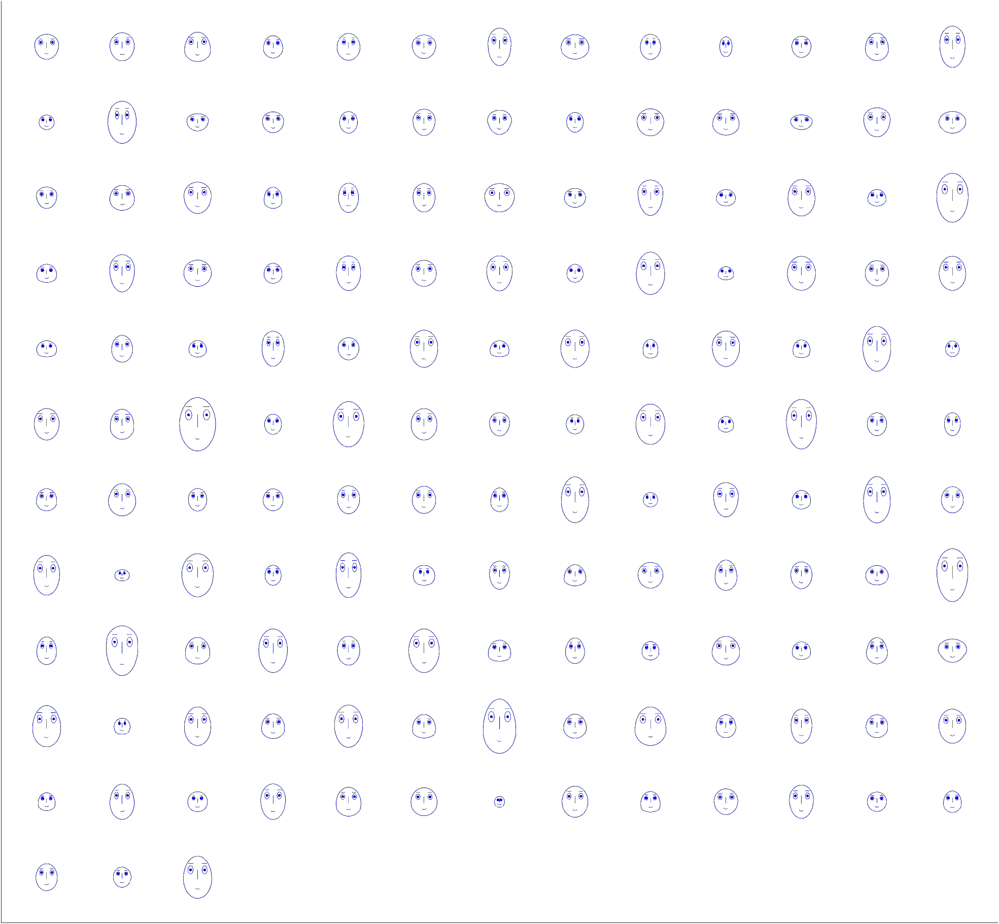

In [17]:
fig = chernoff_face(data=face_chinstrap.drop(['Species'], axis=1),
                    figsize=(30,30), dpi=300)

fig.tight_layout()
plt.show()

#### MATLAB
Syntax: >> glyphplot(ChinstrapSize,'glyph','face','obslabels','')
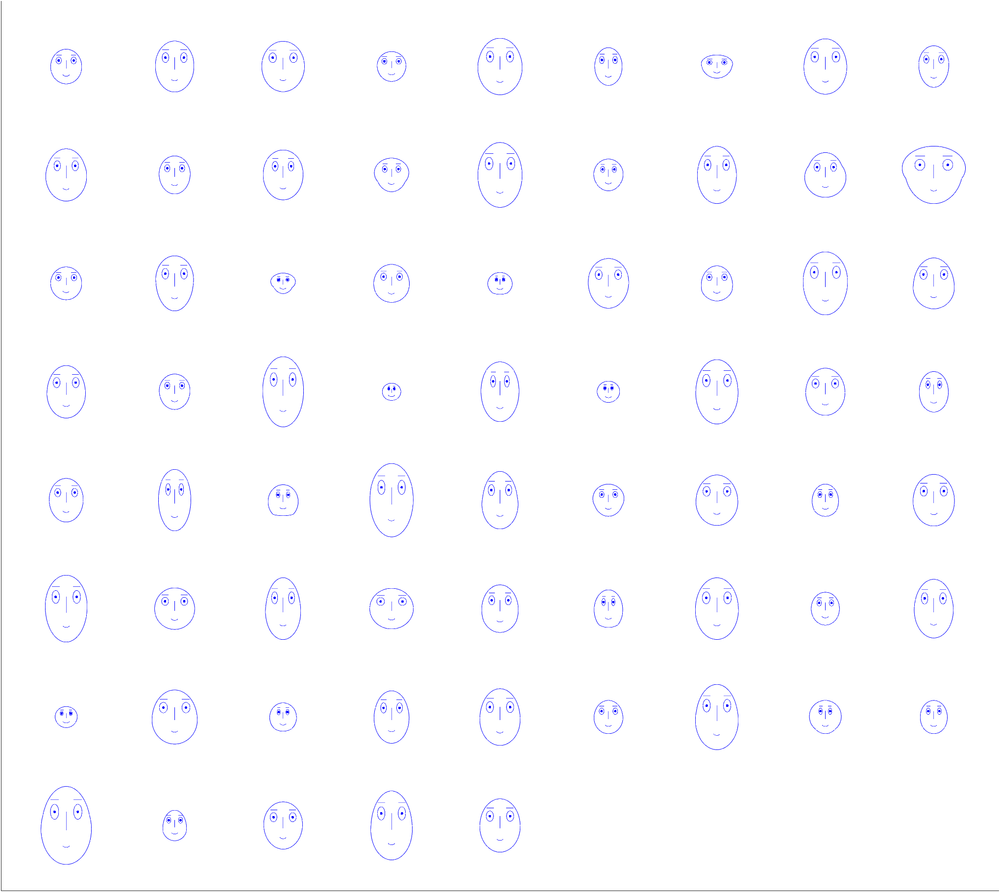

In [18]:
fig = chernoff_face(data=face_gentoo.drop(['Species'], axis=1),
                    figsize=(30,30), dpi=300)

fig.tight_layout()
plt.show()

#### MATLAB
Syntax: >> glyphplot(GentooSize,'glyph','face','obslabels','')
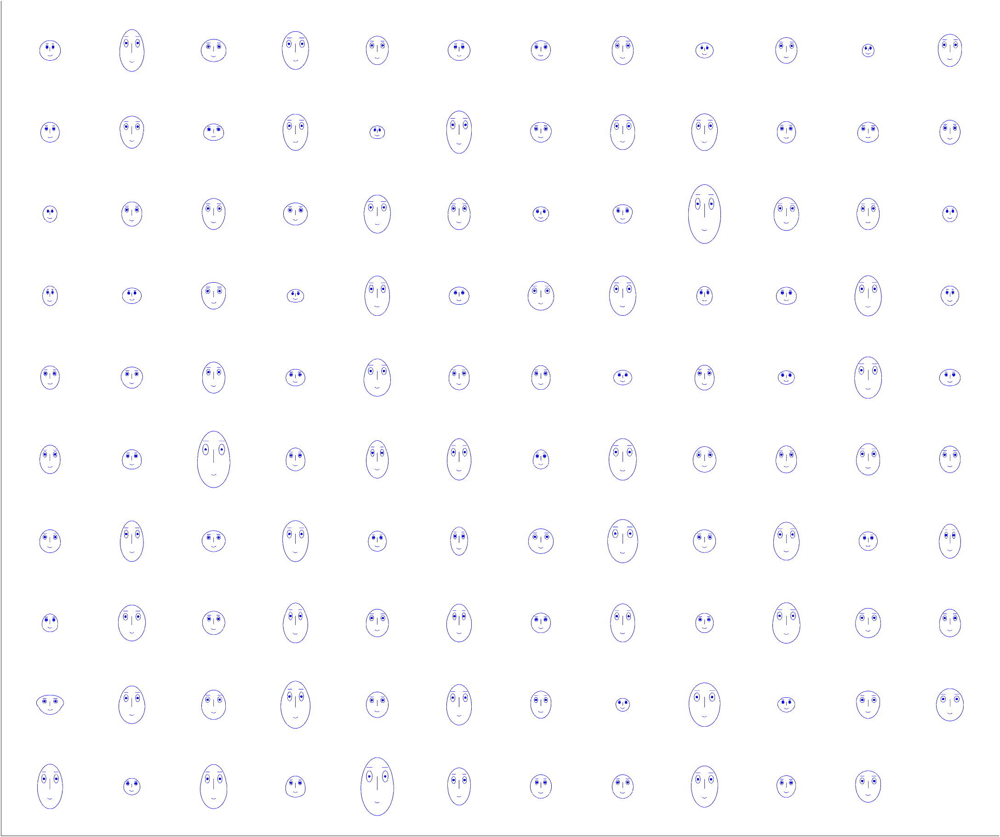

# Star Glyphs
- The images are obtained using the system *Matlab*.
- Syntax: >> glyphplot(X,'glyph','star','obslabels','')

#### Adelie

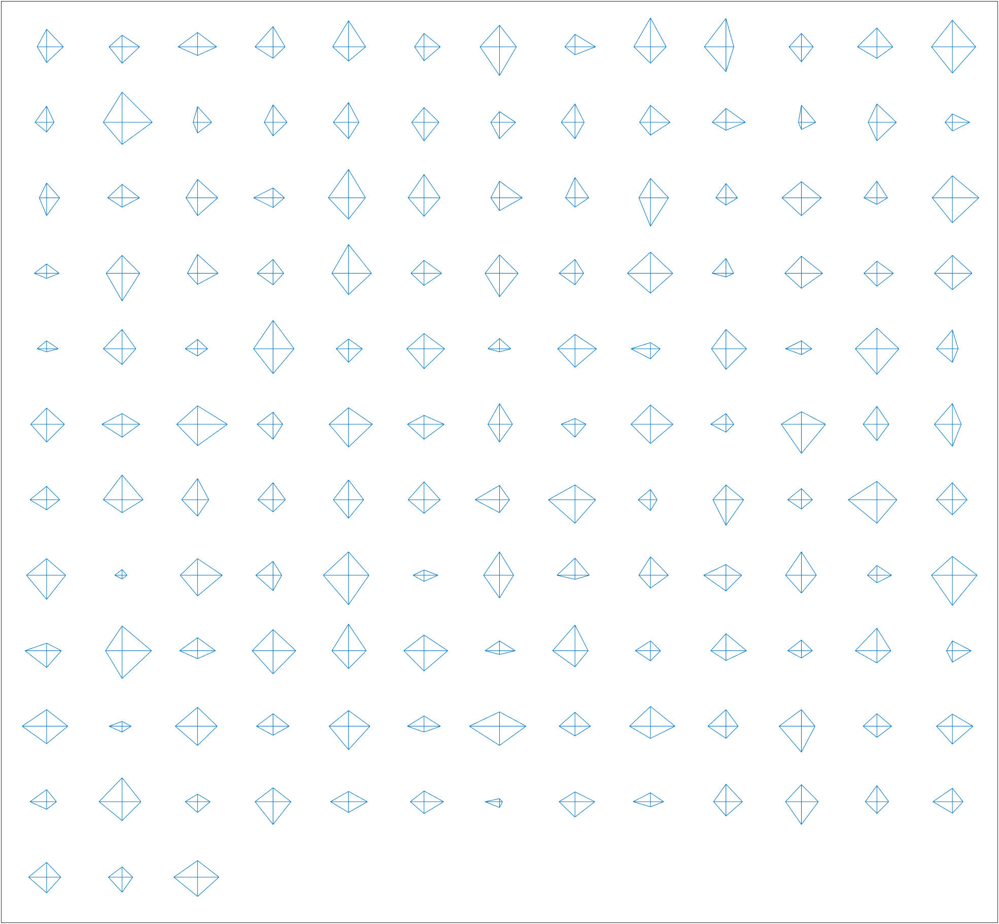

#### Chinstrap

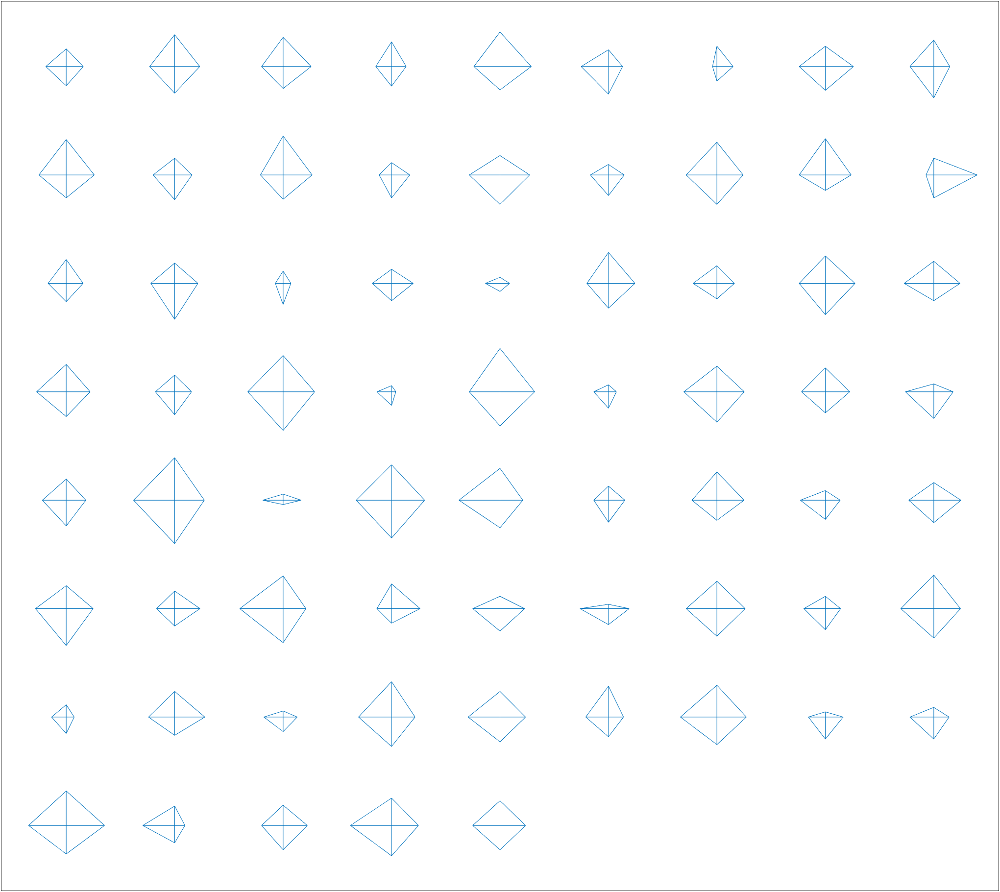

#### Gentoo

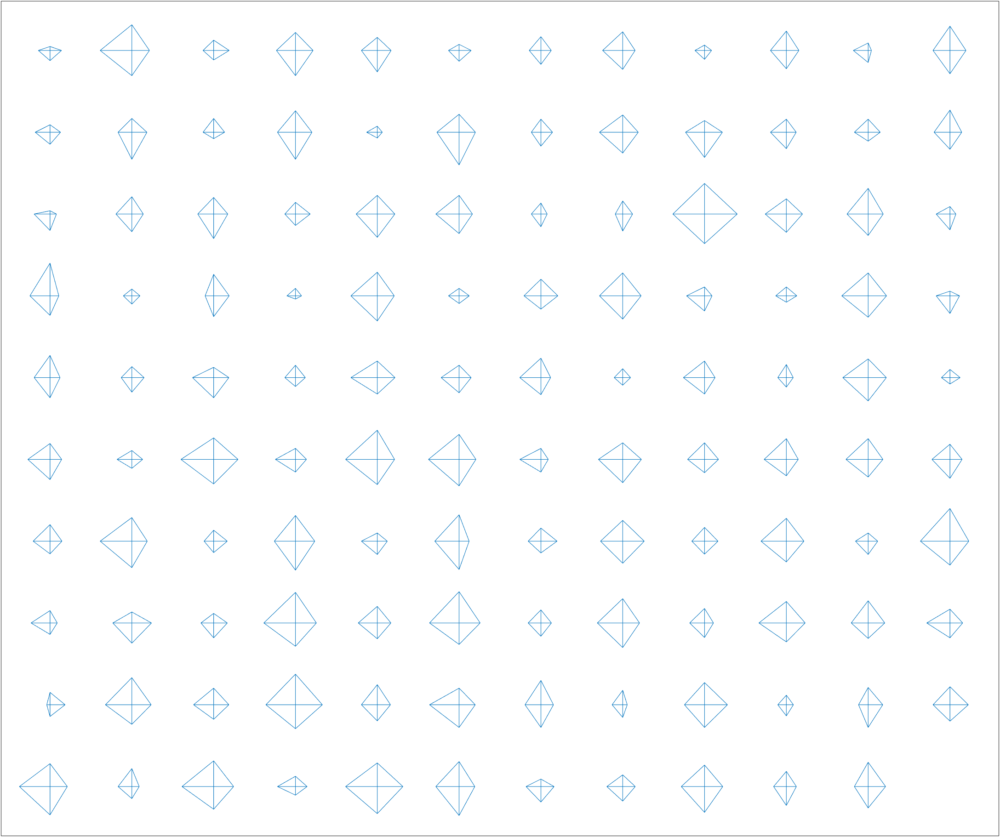